<a href="https://colab.research.google.com/github/RafaelPassador/Classificacao-de-Genero-por-Nomes/blob/main/Trabalho1_AM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---
<p align="left">
  <big>
    <b>
      <pre>
Camila Manara Ribeiro                - RA: 760465 
Júlia Aparecida Sousa de Oliveira    - RA: 769707 
Luciana Oliveira de Souza Gomes      - RA: 743569
Rafael Vinicius Polato Passador      - RA: 790036 
      </pre>
      <br>
      Disciplina: Aprendizado de Máquina
      <br>
      Professor: Prof. Dr. Diego Furtado Silva
      <br>
    </b>
  </big>
</p>


---

<h1 align="center"><b><big>Projeto de Implementação 01- Classificação de nomes por gênero</big></b></h1>




#**Introdução**

<br>

Neste documento será apresentado o código utilizado para implementação do trabalho proposto: um problema representado por dados estruturados e que possa ser resolvido com algoritmos de AM supervisionado vistos em aula

Dessa forma, para realização desta tarefa, escolheu-se um conjunto de nomes rotuládos como masculinos e femininos que serviu como dataset para classificação de gênero, utilizando, para isso, diversas features que serão abordadas durante o código. 

Assim sendo, serão apresentados os códigos utilizados, bem como as descrições das criações destes. Ademais, apresentam-se, também, as interpretações e documentações da problemática.

Link para a apresentação: 

# IMPORT



In [1]:
#Imports de bibliotecas necessárias que foram utilizadas durante a execução do código

In [2]:
import pandas as pd
import numpy as np


In [3]:
import matplotlib.pyplot as plt

In [4]:
import random
import nltk


In [5]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics import confusion_matrix


# CARREGAR O DATASET


Carregamento do dataset com plot gráfico evidenciando o desbalanceamento entre classes

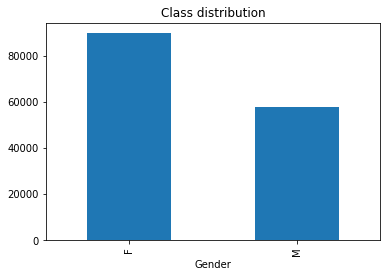

In [7]:
dataset = pd.read_csv('name_gender_dataset.csv')

dataset.pivot_table(index='Gender', aggfunc='size').plot(kind='bar', title = 'Class distribution')


# RANDOM OVERSAMPLING


Como se tratava de um dataset com dados desbalanceados, admitiu-se uma estratégia para contornar esse possível entrave que possibilitaria uma classificação tendenciosa, uma vez que, o número de nomes considerados "femininos" era consideravelmente superior aos masculinos.

Nesse contexto, utiliza-mos uma função de Random OverSampling, em que, aleatoriamente, duplica-se exemplos da classe minoritária (nomes masculinos)

In [8]:
def oversampler(dataset):
    classes = dataset.Gender.value_counts().to_dict()
    maior = max(classes.values())
    classes_lista = []
    for key in classes:
        classes_lista.append(dataset[dataset['Gender'] == key]) 
    classes_exemplo = []
    for i in range(1,len(classes_lista)):
        classes_exemplo.append(classes_lista[i].sample(maior, replace=True))
    dataset_prov = pd.concat(classes_exemplo)
    final_dataset = pd.concat([dataset_prov,classes_lista[0]], axis=0)
    final_dataset = final_dataset.reset_index(drop=True)
    return final_dataset

In [9]:
dataset = oversampler(dataset)

In [10]:
print(dataset)

             Name Gender  Count   Probability
0          Junsei      M      2  5.473480e-09
1           Maudy      M      1  2.736740e-09
2       Theadoros      M      1  2.736740e-09
3        Lieghton      M      1  2.736740e-09
4          Sadane      M      5  1.368370e-08
...           ...    ...    ...           ...
179493      Zyika      F      1  2.736740e-09
179494   Zymeliah      F      1  2.736740e-09
179495     Zyrije      F      1  2.736740e-09
179496    Zyrinah      F      1  2.736740e-09
179497       Zyta      F      1  2.736740e-09

[179498 rows x 4 columns]


In [11]:
dataset.head()

,Name,Gender,Count,Probability
0,Junsei,M,2,5.473480e-09
1,Maudy,M,1,2.736740e-09
2,Theadoros,M,1,2.736740e-09
3,Lieghton,M,1,2.736740e-09
4,Sadane,M,5,1.368370e-08


In [12]:
dataset.dtypes

Name            object
Gender          object
Count            int64
Probability    float64
dtype: object

In [13]:
M_data = dataset[dataset.Gender == 'M']
F_data = dataset[dataset.Gender == 'F']

In [14]:
print(M_data)
print(F_data)

            Name Gender  Count   Probability
0         Junsei      M      2  5.473480e-09
1          Maudy      M      1  2.736740e-09
2      Theadoros      M      1  2.736740e-09
3       Lieghton      M      1  2.736740e-09
4         Sadane      M      5  1.368370e-08
...          ...    ...    ...           ...
89744   Strartis      M      1  2.736740e-09
89745     Cesare      M    654  1.789830e-06
89746     Paseka      M      1  2.736740e-09
89747   Demarien      M     47  1.286270e-07
89748   Naphtali      M    226  6.185030e-07

[89749 rows x 4 columns]
             Name Gender    Count   Probability
89749        Mary      F  4169663  1.141129e-02
89750   Elizabeth      F  1704140  4.663789e-03
89751    Patricia      F  1608260  4.401391e-03
89752    Jennifer      F  1584426  4.336163e-03
89753       Linda      F  1480592  4.051996e-03
...           ...    ...      ...           ...
179493      Zyika      F        1  2.736740e-09
179494   Zymeliah      F        1  2.736740e-09
17

In [15]:
M_nomes = M_data[M_data.columns[0]].tolist()
F_nomes = F_data[F_data.columns[0]].tolist()

Como podemos observar, a distribuição de dados entre as classes está, agora, balanceada

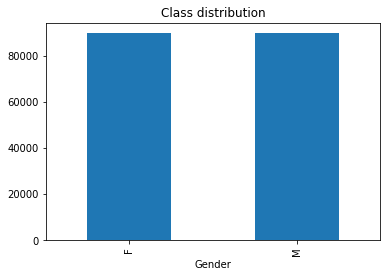

In [16]:
dataset.pivot_table(index='Gender', aggfunc='size').plot(kind='bar', title = 'Class distribution')


# TREINAMENTO TF-IDF


Nessa seção, apresentaremos o código do treinamento realizado a partir do valor de TF-IDF como feature.
O Tf–idf é uma medida estatística que tem o intuito de indicar a importância de uma palavra de um documento em relação ao dataset, ou seja, calcula-se um valor baseado na sua incidência e admite isso como feature. 

Como classificador, utilizou-se o Naive Bayes.


In [17]:
#Transformando os rótulos 'F' e 'M'
dataset_binario = dataset

dataset_binario.Gender.replace({'F':0,'M':1},inplace=True)

dataset_binario.Gender.unique()


array([1, 0])

In [18]:
#Vetorizando todos os nomes e extraindo seu valor de TF-IDF como feature, futuramente utilizada pelo Naive Bayes
Xfeatures = dataset_binario['Name']
convertor = TfidfVectorizer()

#Features
X = convertor.fit_transform(Xfeatures)
convertor.get_feature_names()
#Rotulos
y = dataset_binario.Gender


In [19]:
#Separando os dados entre treinamento e teste
X_treino, X_teste, y_treino, y_teste = train_test_split(X, y)

#Classificando o dataset a partir das features com o Naive Bayes
classifier = MultinomialNB()
classifier.fit(X_treino,y_treino)


MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [20]:
final_results = classifier.predict(X_teste)
print(final_results)

[1 1 1 ... 1 1 1]


In [21]:
#Calculando acurácia da amostra
print("Accuracy of Model",classifier.score(X_teste,y_teste)*100,"%")

Accuracy of Model 50.531476323119776 %


In [22]:
print("Accuracy of Model",classifier.score(X_treino,y_treino)*100,"%")


Accuracy of Model 94.39100302325754 %


In [23]:
print(y_teste)
print(final_results)

14641     1
157081    0
37087     1
5916      1
170868    0
         ..
83634     1
117473    0
88418     1
100364    0
18155     1
Name: Gender, Length: 44875, dtype: int64
[1 1 1 ... 1 1 1]


In [24]:
#Calculando o F1-Score da amotstra
print("F1: ", f1_score(y_teste, final_results))

F1:  0.6533735146698312


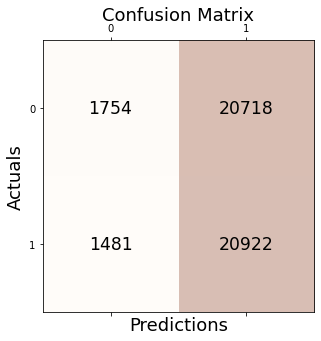

In [25]:
conf_matrix = confusion_matrix(y_true=y_teste, y_pred=final_results)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

# TREINAMENTO COM EXTRAÇÕES DE LETRAS 

Nessa seção, apresentaremos o código do treinamento realizado a partir da extração de features gramaticais.
Realizamos a testagem considerando sufixos, prefixos e a combinação de ambos para averiguar qual configuração apresentava melhores resultados e, posteriormente, evidencia-se as features mais relevantes

Como classificador, tambéum utilizou-se o Naive Bayes.

In [26]:
#feature considerando o sufixo
def feature_sufixo(x):
    return {'sufixo1': x[-1:],
            'sufixo2': x[-2:],
            }
feature_sufixo('Josephine')

{'sufixo1': 'e', 'sufixo2': 'ne'}

In [27]:
#feature combinando prefixo e sufixo
def feature_prefixosufixo(x):
    return {'sufixo1': x[-1:],
            'sufixo2': x[-2:],
            'prefixo': x[:2],
            }
feature_prefixosufixo('Josephine')

{'prefixo': 'Jo', 'sufixo1': 'e', 'sufixo2': 'ne'}

In [28]:
#feature considerando o prefixo
def feature_prefixo(x):
    return {
            'prefixo': x[0],
            'prefixo2': x[:2],
            }
feature_prefixo('Josephine')

{'prefixo': 'J', 'prefixo2': 'Jo'}

In [29]:
final_dataset = dataset.iloc[:,[0,1]]


In [30]:
dataset_features = final_dataset

print(dataset_features)

             Name  Gender
0          Junsei       1
1           Maudy       1
2       Theadoros       1
3        Lieghton       1
4          Sadane       1
...           ...     ...
179493      Zyika       0
179494   Zymeliah       0
179495     Zyrije       0
179496    Zyrinah       0
179497       Zyta       0

[179498 rows x 2 columns]


In [31]:
M_data2 = dataset_features[dataset_features.Gender == 1]
F_data2 = dataset_features[dataset_features.Gender == 0]


M_nomes2 = M_data2[M_data2.columns[0]].tolist()
F_nomes2 = F_data2[F_data2.columns[0]].tolist()


##Treinamento utilizando o prefixo dos nomes como features para o classificador

In [ ]:
#Treinamento com as features sendo PREFIXO (rodar somente 1 dos blocos)


nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_prefixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[50000:], set_features[:50000]
classifier = nltk.NaiveBayesClassifier.train(set_treino)


[('Vanshu', 1), ('Brynmor', 1), ('Javarris', 1), ('Shrish', 1), ('Aaraav', 1), ('Madhuka', 1), ('Esperanza', 1), ('Koleton', 1), ('Magdaleno', 1), ('Hart', 1), ('Carmela', 1), ('Asthon', 1), ('Raheen', 1), ('Quantrell', 1), ('Aveyon', 1), ('Eashan', 1), ('Marine', 1), ('Ramier', 1), ('Tatton', 1), ('Cody-James', 1), ('Bing', 1), ('Joshus', 1), ('Zebastian', 1), ('Tomer', 1), ('Norik', 1), ('Elijawon', 1), ('Shivain', 1), ('Tavarus', 1), ('Klever', 1), ('Yuriy', 1), ('Tavarious', 1), ('Demarion', 1), ('Andrew-Minus', 1), ('Yuyao', 1), ('Lonka', 1), ('Keoh', 1), ('Hy', 1), ('Vahan', 1), ('Bengi', 1), ('Tyreef', 1), ('Abheek', 1), ('Aleron', 1), ('Rylund', 1), ('Eathin', 1), ('Sherod', 1), ('Macel', 1), ('Masanobu', 1), ('Zhyair', 1), ('Christopfer', 1), ('Ajax', 1), ('Rashand', 1), ('Angadvir', 1), ('Diwan', 1), ('Andrej-Ivan', 1), ('Davian', 1), ('Daewon', 1), ('Mcauthur', 1), ('Kadean', 1), ('Shailv', 1), ('Tiziano', 1), ('Panagotis', 1), ('Elward', 1), ('Angeldejesus', 1), ('Shaunak',

In [ ]:
print(nltk.classify.accuracy(classifier, set_teste))

0.10728


In [ ]:
classifier.show_most_informative_features(15)


Most Informative Features
                prefixo2 = 'Kv'                1 : 0      =     11.2 : 1.0
                prefixo2 = 'Jc'                1 : 0      =      9.7 : 1.0
                prefixo2 = 'Wl'                1 : 0      =      9.7 : 1.0
                prefixo2 = 'Js'                1 : 0      =      8.5 : 1.0
                prefixo2 = 'Ob'                1 : 0      =      8.0 : 1.0
                prefixo2 = 'Ax'                1 : 0      =      7.3 : 1.0
                prefixo2 = 'Uy'                1 : 0      =      6.7 : 1.0
                prefixo2 = 'Tw'                0 : 1      =      6.7 : 1.0
                prefixo2 = 'Wo'                1 : 0      =      6.5 : 1.0
                prefixo2 = 'Bj'                1 : 0      =      5.8 : 1.0
                prefixo2 = 'Dm'                1 : 0      =      5.7 : 1.0
                prefixo2 = 'Md'                1 : 0      =      5.2 : 1.0
                prefixo2 = 'TR'                1 : 0      =      5.2 : 1.0

In [ ]:
#Treinamento com as features sendo PREFIXO (rodar somente 1 dos blocos)

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_prefixo(name))
  vetor.append(guess)
print(vetor)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 

In [ ]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 

In [ ]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [ ]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.18740641197926666


In [ ]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

##Treinamento utilizando a combinação prefixo e sufixo dos nomes como features para o classificador

In [32]:
#Treinamento com as features sendo PREFIXO+SUFIXO

nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_prefixosufixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[500:], set_features[:500]
classifier = nltk.NaiveBayesClassifier.train(set_treino)

[('Junsei', 1), ('Maudy', 1), ('Theadoros', 1), ('Lieghton', 1), ('Sadane', 1), ('Normen', 1), ('Yoram', 1), ('Clara', 1), ('Raysean', 1), ('Moxley', 1), ('Basilis', 1), ('Oaklin', 1), ('Adit', 1), ('Quintine', 1), ('Malee', 1), ('Dashell', 1), ('Kilburn', 1), ('Jario', 1), ('Germani', 1), ('Kealoha', 1), ('Maisan', 1), ('Laderrius', 1), ('Raciel', 1), ('Kailob', 1), ('Adeev', 1), ('Jarvous', 1), ('Maki', 1), ('Qushawn', 1), ('Crowell', 1), ('Edu', 1), ('Blaiden', 1), ('Linell', 1), ('Martavious', 1), ('Jonmarc', 1), ('Casimere', 1), ('Ruichen', 1), ('Dreydan', 1), ('Spurgeon', 1), ('Sameul', 1), ('Shaquell', 1), ('Skanda', 1), ('Adyaan', 1), ('Asael', 1), ('Kesuan', 1), ('Sade', 1), ('Auturo', 1), ('Randol', 1), ('Demitrious', 1), ('Monet', 1), ('Jeetan', 1), ('Leondrus', 1), ('Everette', 1), ('Taevian', 1), ('Kar', 1), ('Carter', 1), ('Martae', 1), ('Sladen', 1), ('Caison', 1), ('Yonas', 1), ('Jiaan', 1), ('Maverick', 1), ('So', 1), ('Princezion', 1), ('Emmanoel', 1), ('Kilik', 1), (

In [33]:
print(nltk.classify.accuracy(classifier, set_teste))

0.774


In [34]:
classifier.show_most_informative_features(15)


Most Informative Features
                 sufixo2 = 'os'                1 : 0      =     33.9 : 1.0
                 sufixo2 = 'ob'                1 : 0      =     28.3 : 1.0
                 sufixo2 = 'yk'                1 : 0      =     23.1 : 1.0
                 sufixo2 = 'io'                1 : 0      =     19.4 : 1.0
                 sufixo2 = 'ib'                1 : 0      =     18.7 : 1.0
                 sufixo2 = 'ik'                1 : 0      =     18.5 : 1.0
                 sufixo2 = 'jr'                1 : 0      =     18.4 : 1.0
                 sufixo2 = 'up'                1 : 0      =     17.8 : 1.0
                 sufixo2 = 'ck'                1 : 0      =     17.6 : 1.0
                 sufixo2 = 'rd'                1 : 0      =     16.8 : 1.0
                 sufixo2 = 'ff'                1 : 0      =     16.5 : 1.0
                 sufixo2 = 'bb'                1 : 0      =     16.4 : 1.0
                 sufixo2 = 'av'                1 : 0      =     15.3 : 1.0

In [35]:
#Treinamento com as features sendo PREFIXO+SUFIXO

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_prefixosufixo(name))
  vetor.append(guess)
print(vetor)

[0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 

In [36]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 

In [37]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [38]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.7668300389979583


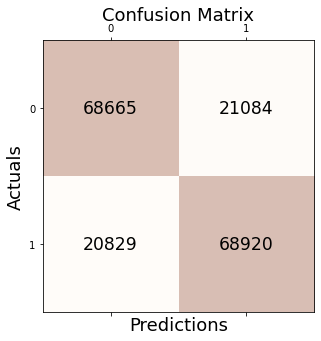

In [39]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

##Treinamento utilizando o sufixo dos nomes como features para o classificador

In [ ]:
#Treinamento com as features sendo SUFIXO


nomes_rotulados = ([(Name, 1) for Name in M_nomes2] + [(Name, 0) for Name in F_nomes2])
print(nomes_rotulados)
#random.shuffle(nomes_rotulados)

set_features = [(feature_sufixo(n), Gender) for (n, Gender) in nomes_rotulados]
set_treino, set_teste = set_features[50000:], set_features[:50000]
classifier = nltk.NaiveBayesClassifier.train(set_treino)

[('Vanshu', 1), ('Brynmor', 1), ('Javarris', 1), ('Shrish', 1), ('Aaraav', 1), ('Madhuka', 1), ('Esperanza', 1), ('Koleton', 1), ('Magdaleno', 1), ('Hart', 1), ('Carmela', 1), ('Asthon', 1), ('Raheen', 1), ('Quantrell', 1), ('Aveyon', 1), ('Eashan', 1), ('Marine', 1), ('Ramier', 1), ('Tatton', 1), ('Cody-James', 1), ('Bing', 1), ('Joshus', 1), ('Zebastian', 1), ('Tomer', 1), ('Norik', 1), ('Elijawon', 1), ('Shivain', 1), ('Tavarus', 1), ('Klever', 1), ('Yuriy', 1), ('Tavarious', 1), ('Demarion', 1), ('Andrew-Minus', 1), ('Yuyao', 1), ('Lonka', 1), ('Keoh', 1), ('Hy', 1), ('Vahan', 1), ('Bengi', 1), ('Tyreef', 1), ('Abheek', 1), ('Aleron', 1), ('Rylund', 1), ('Eathin', 1), ('Sherod', 1), ('Macel', 1), ('Masanobu', 1), ('Zhyair', 1), ('Christopfer', 1), ('Ajax', 1), ('Rashand', 1), ('Angadvir', 1), ('Diwan', 1), ('Andrej-Ivan', 1), ('Davian', 1), ('Daewon', 1), ('Mcauthur', 1), ('Kadean', 1), ('Shailv', 1), ('Tiziano', 1), ('Panagotis', 1), ('Elward', 1), ('Angeldejesus', 1), ('Shaunak',

In [ ]:
print(nltk.classify.accuracy(classifier, set_teste))

0.68422


In [ ]:
classifier.show_most_informative_features(15)


Most Informative Features
                 sufixo2 = 'ob'                1 : 0      =     36.9 : 1.0
                 sufixo2 = 'os'                1 : 0      =     31.1 : 1.0
                 sufixo2 = 'io'                1 : 0      =     19.2 : 1.0
                 sufixo2 = 'jr'                1 : 0      =     18.7 : 1.0
                 sufixo2 = 'nk'                1 : 0      =     18.2 : 1.0
                 sufixo2 = 'yk'                1 : 0      =     17.5 : 1.0
                 sufixo2 = 'ib'                1 : 0      =     17.4 : 1.0
                 sufixo2 = 'ck'                1 : 0      =     17.1 : 1.0
                 sufixo2 = 'rd'                1 : 0      =     16.0 : 1.0
                 sufixo2 = 'eq'                1 : 0      =     15.7 : 1.0
                 sufixo2 = 'cs'                1 : 0      =     15.7 : 1.0
                 sufixo2 = 'ds'                1 : 0      =     15.7 : 1.0
                 sufixo2 = 'ph'                1 : 0      =     15.3 : 1.0

In [ ]:
#Treinamento com as features sendo SUFIXO

vetor = []
for (name, tag) in nomes_rotulados:
  guess = classifier.classify(feature_sufixo(name))
  vetor.append(guess)
print(vetor)

[1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 

In [ ]:
enumerate(vetor)
for i, item in enumerate(vetor):
    if item == 'F':
        vetor[i] = 0
    elif item == 'M':
        vetor[i] = 1

print(vetor)

[1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 

In [ ]:
lista_generos = [Gender for (n, Gender) in nomes_rotulados]
print(lista_generos)

enumerate(lista_generos)
for i, item in enumerate(lista_generos):
    if item == 'F':
        lista_generos[i] = 0
    elif item == 'M':
        lista_generos[i] = 1

print(lista_generos)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [ ]:
print("F1: ", f1_score(lista_generos, vetor))

F1:  0.7369915363374444


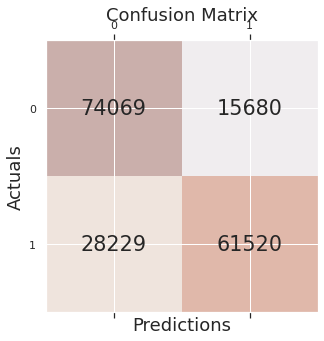

In [ ]:
conf_matrix = confusion_matrix(y_true=lista_generos, y_pred=vetor)
#
# Print the confusion matrix using Matplotlib
#
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(conf_matrix, cmap=plt.cm.Oranges, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()